In [ ]:
# Menginstal paket Kaggle
!pip install kaggle -q

# Mengunduh dataset baru
!kaggle datasets download -d asdasdasasdas/garbage-classification

# Mengekstrak file zip yang diunduh
import zipfile
with zipfile.ZipFile('/content/garbage-classification.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/garbage_data')

Dataset URL: https://www.kaggle.com/datasets/asdasdasasdas/garbage-classification
License(s): copyright-authors
 90% 74.0M/82.0M [00:01<00:00, 69.0MB/s]
100% 82.0M/82.0M [00:01<00:00, 65.2MB/s]


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 12.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inflect 7.4.0 requires typeguard>=4.0.1, but you have typeguard 2.13.3 which is incompatible.
Classes: ['paper', 'plastic', 'trash', 'cardboard', 'glass', 'metal']
31790344/31790344 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 60s 428ms/step - accuracy: 0.4071 - loss: 1.4933 - val_accuracy: 0.7792 - val_loss: 0.7265
Epoch 2/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 17s 278ms/step - accuracy: 0.7310 - loss: 0.7499 - val_accuracy: 0.8125 - val_loss: 0.5772
Epoch 3/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 320ms/step - accuracy: 0.7823 - loss: 0.6395 - val_accuracy: 0.8354 - val_loss: 0.5388
Epoch 4/10
63/63 ━━━━━━━━━━━━━━━━━━━━ 17s 278ms/step - accuracy: 0.8274 - loss: 0.5193 - val_accuracy: 0.8479 - val_loss: 0.4730
Epoch 5/10
63

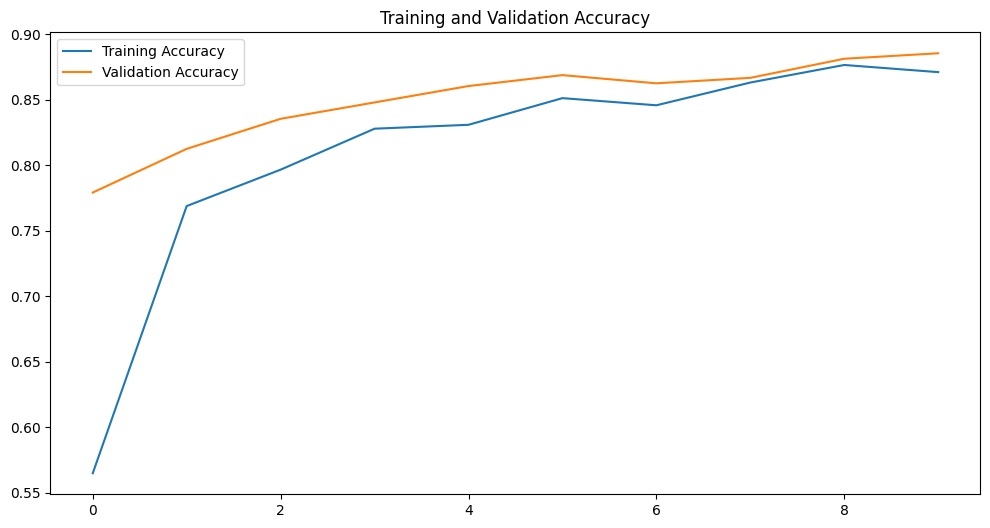

In [ ]:
# Install dependencies (if not already installed)
!pip install -q tensorflow tensorflow-addons tf-slim opencv-python-headless

# Import necessary libraries
import os
import numpy as np
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetB2
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, precision_recall_fscore_support
import matplotlib.pyplot as plt
from tqdm import tqdm

# Step 1: Prepare Dataset
dataset_path = "/content/garbage_data/Garbage classification/Garbage classification"
classes = os.listdir(dataset_path)
print("Classes:", classes)

# Prepare the dataset paths and labels
image_paths, labels = [], []
for label, class_name in enumerate(classes):
    class_dir = os.path.join(dataset_path, class_name)
    for img_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, img_name))
        labels.append(label)

# Create a DataFrame
import pandas as pd
data = pd.DataFrame({
    "image_path": image_paths,
    "label": labels
})

# Split dataset
train_df, test_df = train_test_split(data, test_size=0.2, stratify=data['label'], random_state=42)

# Image preprocessing and augmentation
IMG_SIZE = 224
def preprocess_image(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    return img

def augment_image(img):
    # Example: Augmentations (flip, rotation)
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.rot90(img)
    return img

# Step 2: Data Generators
def data_generator(data, batch_size=32, augment=False):
    while True:
        batch_data = data.sample(batch_size)
        batch_images, batch_labels = [], []
        for _, row in batch_data.iterrows():
            img = preprocess_image(row['image_path'])
            label = row['label']
            if augment:
                img = augment_image(img)
            batch_images.append(img)
            batch_labels.append(label)
        yield np.array(batch_images), np.array(batch_labels)

train_gen = data_generator(train_df, batch_size=32, augment=True)
test_gen = data_generator(test_df, batch_size=32)

# Step 3: Build Classification Model with EfficientNet-B2
base_model = EfficientNetB2(weights="imagenet", include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
x = GlobalAveragePooling2D()(base_model.output)
x = Dropout(0.5)(x)
output = Dense(len(classes), activation="softmax")(x)
model = Model(inputs=base_model.input, outputs=output)

# Freeze the base model initially
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=1e-3), loss="sparse_categorical_crossentropy", metrics=["accuracy"])

# Step 4: Train the Model
history = model.fit(train_gen,
                    steps_per_epoch=len(train_df)//32,
                    validation_data=test_gen,
                    validation_steps=len(test_df)//32,
                    epochs=10)

# Step 5: Evaluate the Model
test_images, test_labels = next(test_gen)
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

# Classification Report
print("Classification Report:")
print(classification_report(test_labels, predicted_labels, target_names=classes))

# Precision, Recall, F1-Score
precision, recall, f1, _ = precision_recall_fscore_support(test_labels, predicted_labels, average='weighted')
print(f"Precision: {precision:.2f}, Recall: {recall:.2f}, F1-Score: {f1:.2f}")

# Plot Training Accuracy and Loss
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title("Training and Validation Accuracy")
plt.legend()
plt.show()

Epoch 1/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 75s 924ms/step - accuracy: 0.2216 - loss: 1.8210 - val_accuracy: 0.3594 - val_loss: 1.6053 - learning_rate: 1.0000e-04
Epoch 2/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 18s 581ms/step - accuracy: 0.3776 - loss: 1.6035 - val_accuracy: 0.5357 - val_loss: 1.4493 - learning_rate: 1.0000e-04
Epoch 3/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 18s 605ms/step - accuracy: 0.4284 - loss: 1.4684 - val_accuracy: 0.6027 - val_loss: 1.3245 - learning_rate: 1.0000e-04
Epoch 4/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 19s 638ms/step - accuracy: 0.5165 - loss: 1.3444 - val_accuracy: 0.6205 - val_loss: 1.2158 - learning_rate: 1.0000e-04
Epoch 5/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 18s 595ms/step - accuracy: 0.6004 - loss: 1.2172 - val_accuracy: 0.7054 - val_loss: 1.1026 - learning_rate: 1.0000e-04
Epoch 6/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 18s 591ms/step - accuracy: 0.6472 - loss: 1.1224 - val_accuracy: 0.7031 - val_loss: 1.0867 - learning_rate: 1.0000e-04
Epoch 7/15
31/31 ━━━━━━━━━━━━━━━━━━━━ 18s 587ms/step - acc

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


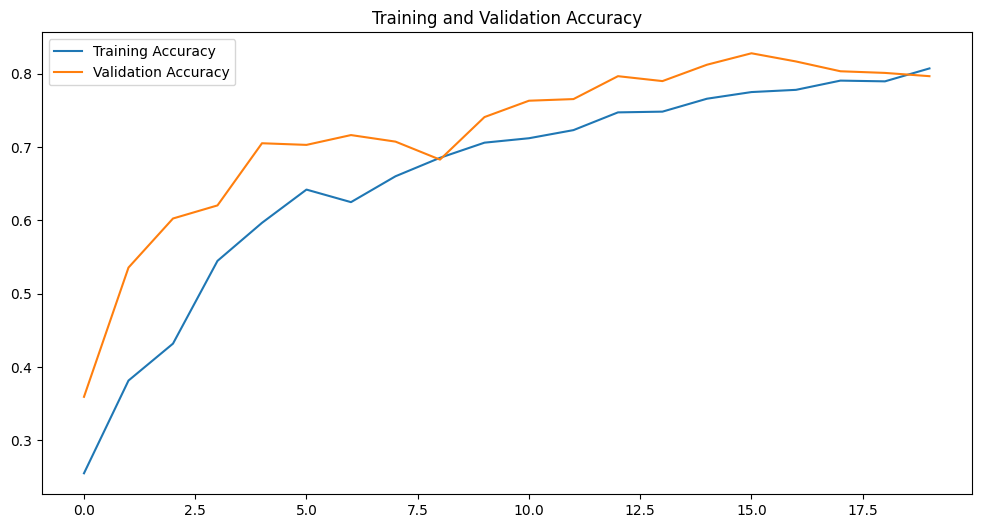

In [ ]:
# Hyperparameter Adjustments
BATCH_SIZE = 64
IMG_SIZE = 224
EPOCHS = 15
INITIAL_LR = 1e-4

# Enhanced Augmentation
def augment_image(img):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.random_brightness(img, 0.2)
    img = tf.image.random_contrast(img, 0.8, 1.2)
    return img

# Data Generator Function
def data_generator(data, batch_size=BATCH_SIZE, augment=False):
    while True:
        batch_data = data.sample(batch_size)
        batch_images, batch_labels = [], []
        for _, row in batch_data.iterrows():
            img = preprocess_image(row['image_path'])
            if augment:
                img = augment_image(img)
            batch_images.append(img)
            batch_labels.append(row['label'])
        yield np.array(batch_images), np.array(batch_labels)

train_gen = data_generator(train_df, batch_size=BATCH_SIZE, augment=True)
test_gen = data_generator(test_df, batch_size=BATCH_SIZE)

# Load Pretrained EfficientNetB2 Model
base_model = EfficientNetB2(weights="imagenet", include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
x = GlobalAveragePooling2D()(base_model.output)
x = Dropout(0.3)(x)
output = Dense(len(classes), activation="softmax")(x)
model = Model(inputs=base_model.input, outputs=output)

# Freeze Base Model Layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the Model
model.compile(optimizer=Adam(learning_rate=INITIAL_LR),
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

# Callbacks: Early Stopping and LR Scheduler
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=2, min_lr=1e-6)
]

# Train the Model
history = model.fit(train_gen,
                    steps_per_epoch=len(train_df) // BATCH_SIZE,
                    validation_data=test_gen,
                    validation_steps=len(test_df) // BATCH_SIZE,
                    epochs=EPOCHS,
                    callbacks=callbacks)

# Unfreeze Some Layers for Fine-Tuning
for layer in base_model.layers[-20:]:  # Unfreeze the last 20 layers
    layer.trainable = True

# Recompile with Lower LR for Fine-Tuning
model.compile(optimizer=Adam(learning_rate=1e-5),
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

# Fine-Tune the Model
history_fine = model.fit(train_gen,
                         steps_per_epoch=len(train_df) // BATCH_SIZE,
                         validation_data=test_gen,
                         validation_steps=len(test_df) // BATCH_SIZE,
                         epochs=5,
                         callbacks=callbacks)

# Evaluate the Model
test_images, test_labels = next(test_gen)
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

# Classification Report
print("Classification Report:")
print(classification_report(test_labels, predicted_labels, target_names=classes))

# Plot Training and Validation Metrics
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'] + history_fine.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'] + history_fine.history['val_accuracy'], label='Validation Accuracy')
plt.title("Training and Validation Accuracy")
plt.legend()
plt.show()


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


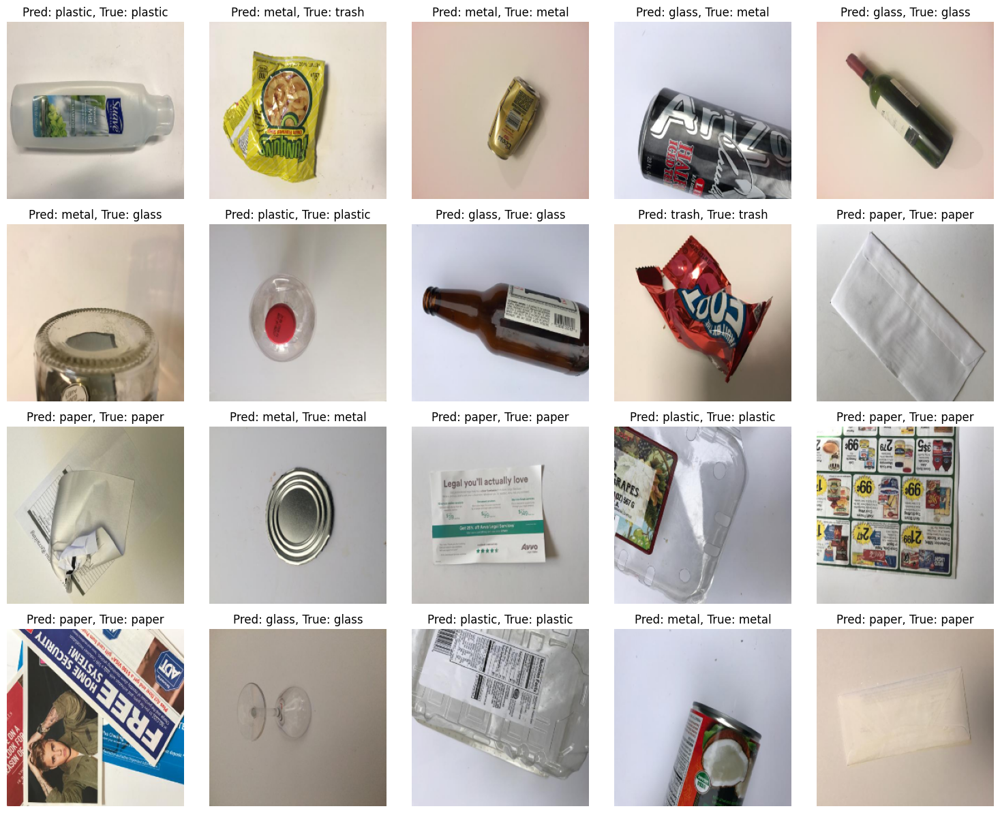

In [ ]:
import matplotlib.pyplot as plt

# Visualize Predictions
def visualize_predictions(test_images, test_labels, predicted_labels, class_names, num_images=20):
    plt.figure(figsize=(15, 15))
    for i in range(num_images):
        ax = plt.subplot(5, 5, i + 1)
        img = test_images[i].astype("uint8")
        true_label = class_names[test_labels[i]]
        pred_label = class_names[predicted_labels[i]]
        plt.imshow(img)
        plt.title(f"Pred: {pred_label}, True: {true_label}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Use the first batch of test images
test_images, test_labels = next(test_gen)
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

# Class Names (based on dataset folders)
class_names = classes

# Visualize
visualize_predictions(test_images, test_labels, predicted_labels, class_names, num_images=20)


In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_2 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_1           │ (None, 224, 224, 3)    │              7 │ rescaling_2[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_3 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_3[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 13,448,637 (51.30 MB)

 Trainable params: 2,835,806 (10.82 MB)

 Non-trainable params: 4,941,217 (18.85 MB)

 Optimizer params: 5,671,614 (21.64 MB)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.286786 to fit



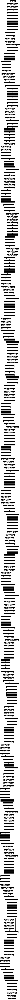

In [ ]:
from tensorflow.keras.utils import plot_model

# Visualisasi struktur model
plot_model(model, to_file='efficientnet_structure.png', show_shapes=True, show_layer_names=True)

In [ ]:
# 2. Analisis Visualisasi Layer
# Pilih beberapa layer dari EfficientNet untuk divisualisasikan
layer_names = [layer.name for layer in base_model.layers if 'conv' in layer.name or 'pool' in layer.name]
layer_outputs = [layer.output for layer in base_model.layers if 'conv' in layer.name or 'pool' in layer.name]

# Model baru untuk visualisasi layer
visualization_model = Model(inputs=base_model.input, outputs=layer_outputs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


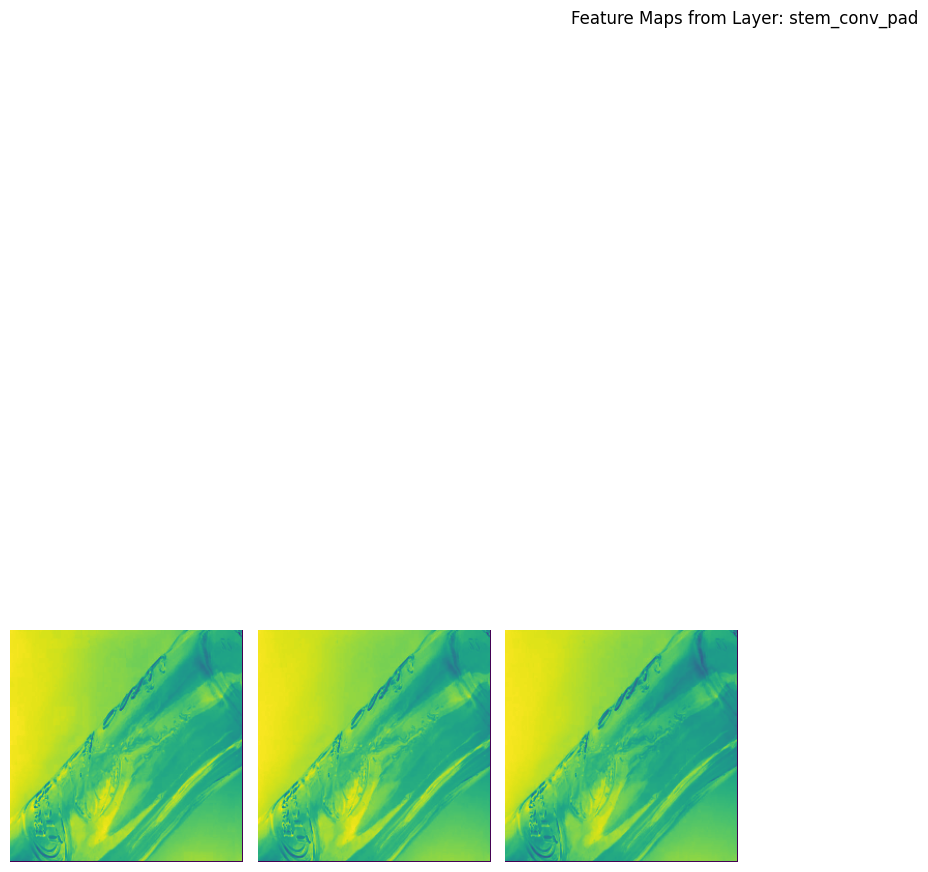

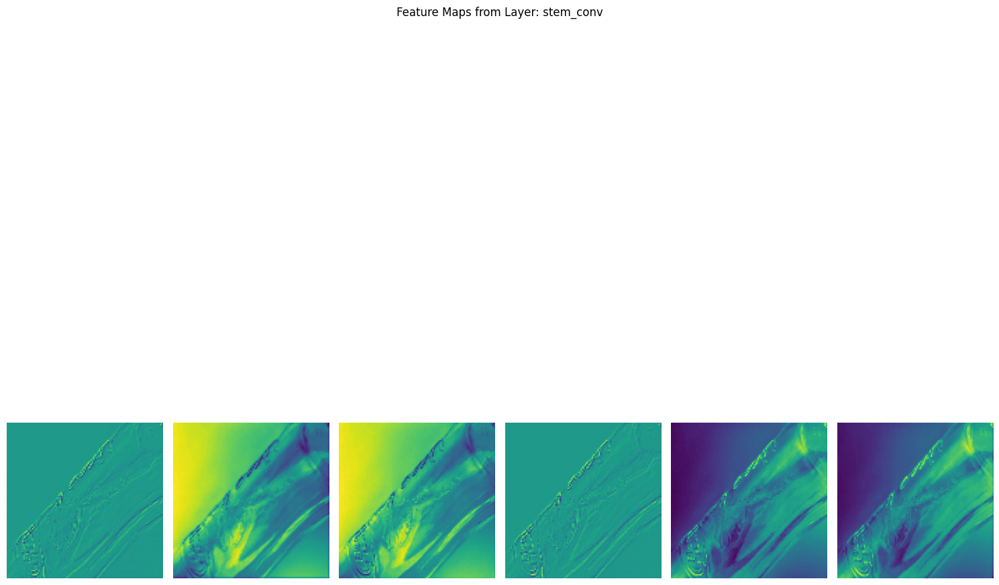

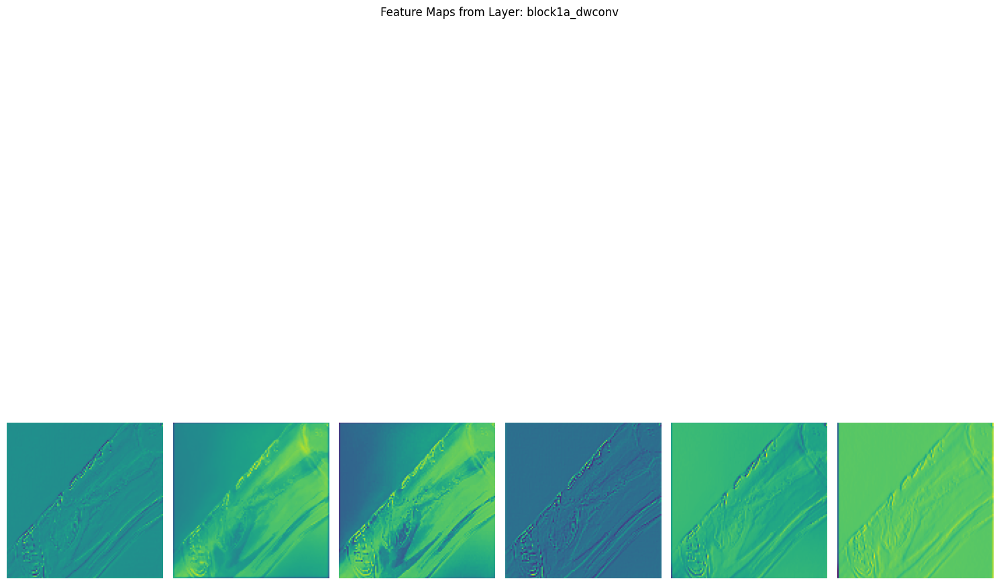

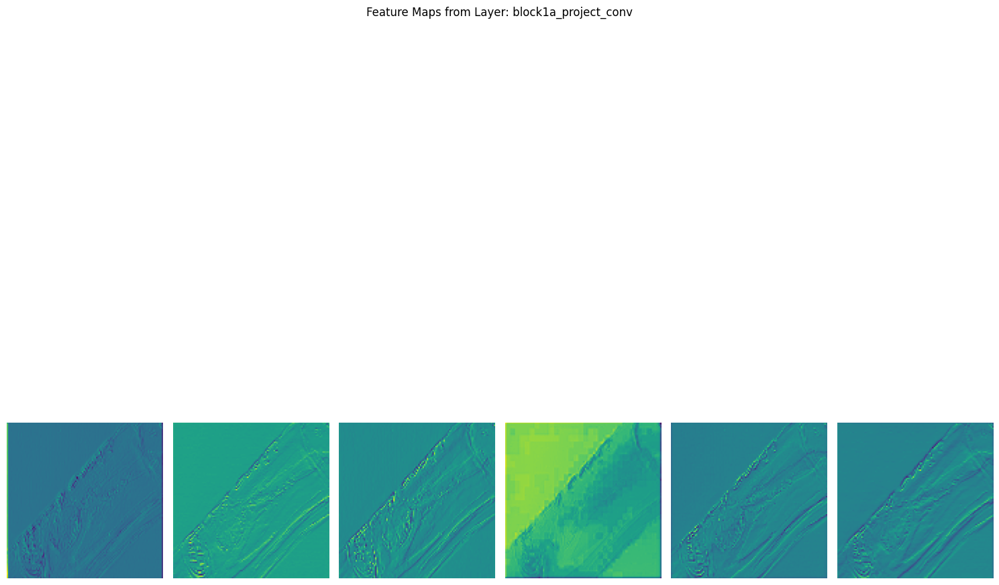

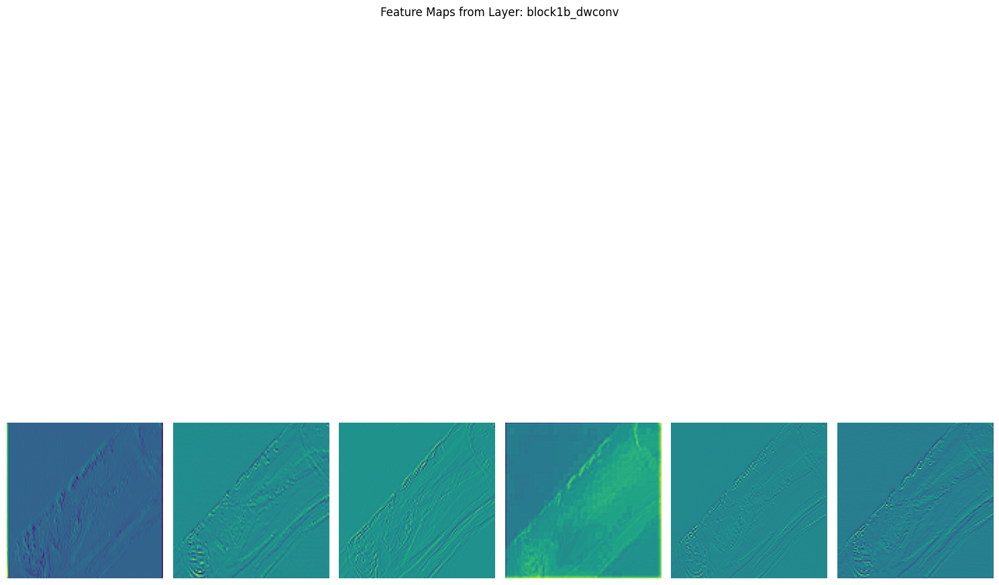

...

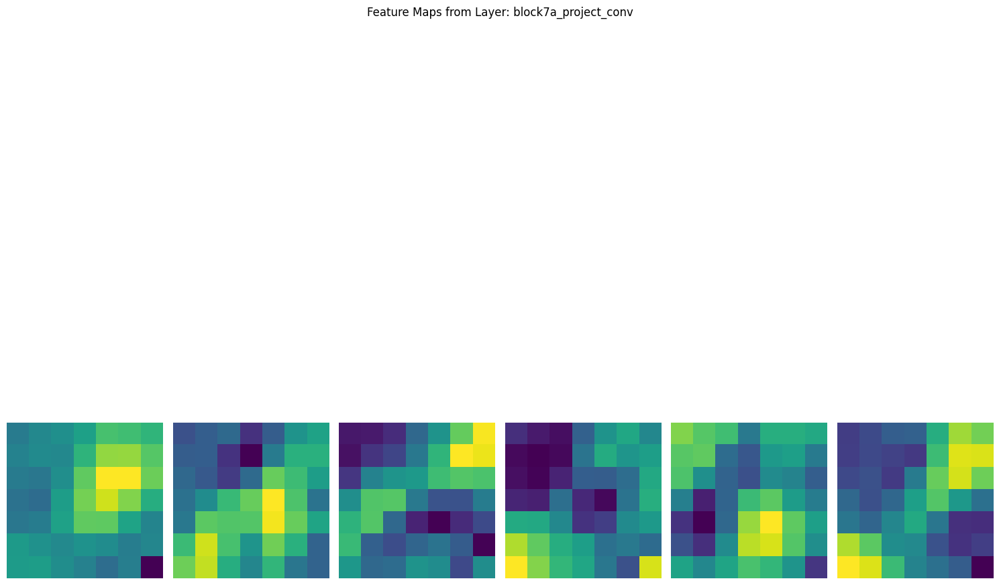

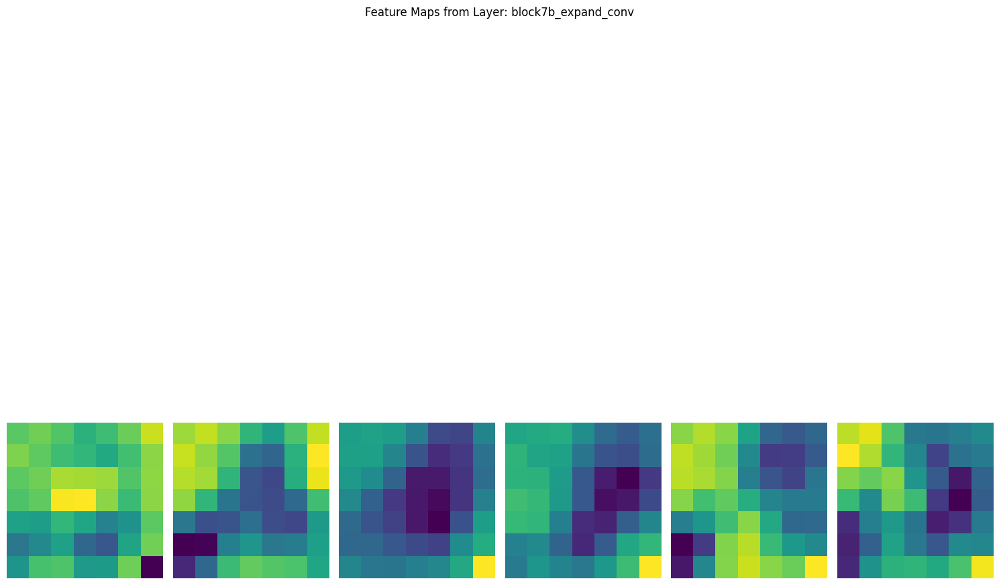

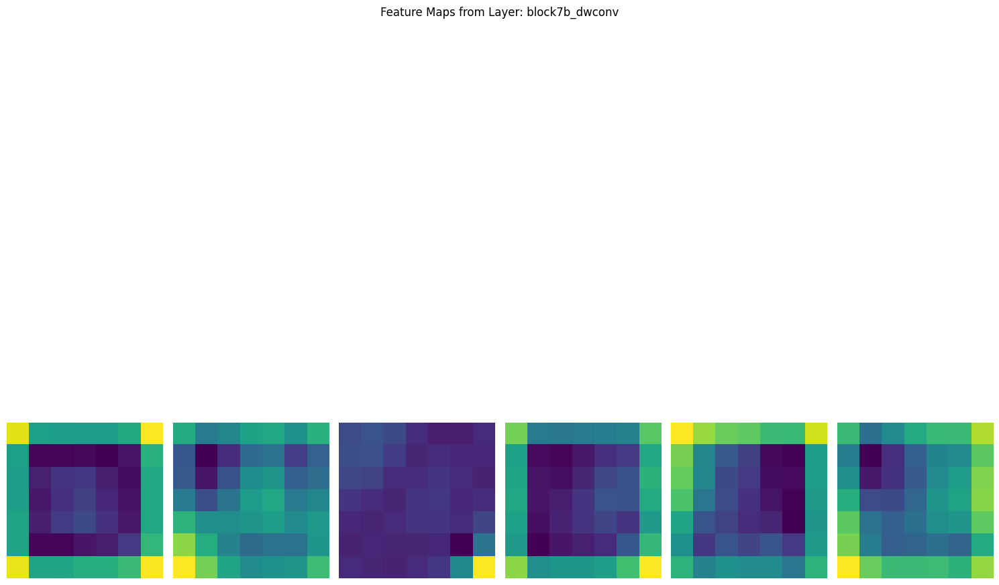

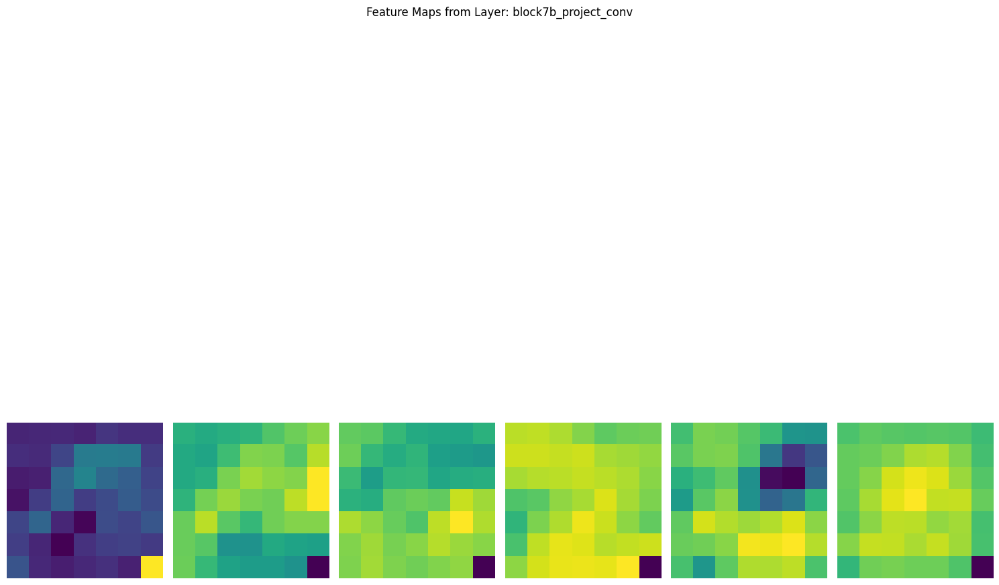

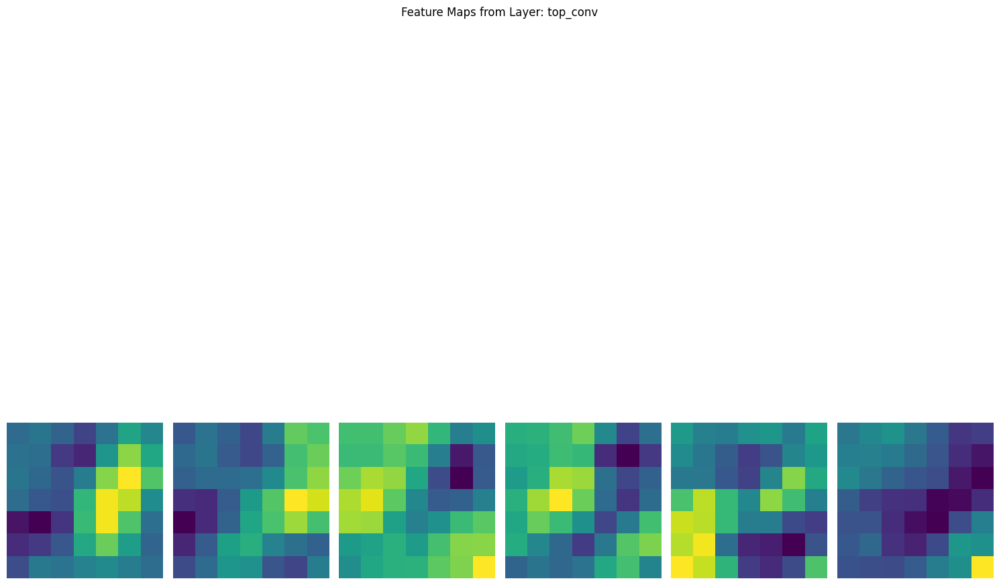

In [ ]:
# Pilih satu gambar dari dataset uji untuk divisualisasikan
sample_image = preprocess_image(test_df['image_path'].iloc[0])
sample_image = np.expand_dims(sample_image, axis=0)  # Tambahkan dimensi batch

# Dapatkan output dari beberapa layer
feature_maps = visualization_model.predict(sample_image)

# Visualisasi beberapa feature maps
for layer_name, feature_map in zip(layer_names, feature_maps):
    if len(feature_map.shape) == 4:  # Jika feature map berbentuk (batch, height, width, channels)
        num_channels = feature_map.shape[-1]
        size = feature_map.shape[1]

        plt.figure(figsize=(15, 15))
        plt.suptitle(f"Feature Maps from Layer: {layer_name}")

        # Plot beberapa channel pertama
        for i in range(min(6, num_channels)):  # Batasi ke 6 channel pertama
            plt.subplot(1, 6, i + 1)
            plt.imshow(feature_map[0, :, :, i], cmap='viridis')
            plt.axis('off')
        plt.tight_layout()
        plt.show()
